# SHOOTING ANALYSIS
- This notebook concerns the steps taken to assess how to filter the shootings dataset
- This is a visualization of what happens in the shootings function in to_curated.py, ohe_curated.py, aggregate_curated.py

In [4]:
import os
import sys  
from pathlib import Path
curr_path = str(Path(os.getcwd()).parent)
sys.path.append(curr_path)
from scripts.constants import *
# Change the directory (magic commands)
from pyspark.sql import SparkSession
from functools import reduce
from pyspark.sql import functions as F
from scripts.plotting_functions import *
import pyproj
import pandas as pd
import geopandas as gpd
from pyspark.sql.types import StructType, StructField, DoubleType

In [5]:
# Create spark session first
spark =(
    SparkSession.builder.appName(SPARK_APP_NAME)
    .config(SPARK_EAGER_VAL, SPARK_EAGER_VAL_SET) 
    .config(SPARK_CACHE_METADATA, SPARK_CACHE_METADATA_SET)
    .config(SPARK_TIMEZONE, SPARK_TIMEZONE_SET)
    .config(SPARK_DRIVER_MEMORY, SPARK_DRIVER_MEMORY_SET)
    .config(SPARK_AUTOBROADCAST_THRESHOLD, SPARK_AUTOBROADCAST_THRESHOLD_SET)
    .config(SPARK_EXECUTOR_MEM_OVERHEAD, SPARK_EXECUTOR_MEM_OVERHEAD_SET)
    .getOrCreate()
)

- We are making new columns to help with graphing and, in particular these are what we need for the analysis
    - Day of Week: most likely to influence a shooting
    - Hour of Day: Can be a common time where shootings happen

## NEW COLUMNS
- These columns will be important in further filtering the data and creating mroe new columns, particularly a one hot encoding of the hour in the day, the day of the week, and the year from the string date column

In [6]:
raw_shootings = spark.read.parquet(f'.{RAW_NYPD_SHOOTINGS}')

# We also need to make some new features
# MONTH_IND = 0
# MONTH_LEN = 2
# DAY_IND = 4
# DAY_LEN = 2
# YEAR_IND = 7
# YEAR_LEN = 4
HOUR_IND = 0
HOUR_LEN = 2
SHOOTINGS_DATE_FORMAT = "MM/dd/yyyy"

raw_shootings = raw_shootings.withColumn(SHOOTINGS_DATE.lower(), F.to_date(F.col(SHOOTINGS_DATE.lower()), SHOOTINGS_DATE_FORMAT))
raw_shootings = raw_shootings.withColumn(YEAR, F.year(F.col(SHOOTINGS_DATE.lower())))
raw_shootings = raw_shootings.withColumn(MONTH, F.month(F.col(SHOOTINGS_DATE.lower())))
raw_shootings = raw_shootings.withColumn(DAY, F.dayofmonth(F.col(SHOOTINGS_DATE.lower())))
raw_shootings = raw_shootings.withColumn(HOUR, F.substring(F.col('occur_time'), HOUR_IND, HOUR_LEN).cast("int"))
raw_shootings = raw_shootings.withColumn(DAY_OF_WEEK, F.dayofweek(F.col(SHOOTINGS_DATE.lower())))
print((raw_shootings.count(), len(raw_shootings.columns)))

(27312, 26)


## SHOOTINGS PER YEAR ANALYSIS
- We nee to visualize the shootings so we have an idea of not only the trend, but the desired time range for shooting

- First get the shooting dataset, and visualize the progression of shootings

In [7]:
# We only want years related to taxis, so from 2016
raw_shootings = raw_shootings.filter((F.col(YEAR) >= FROM_YEAR) & (F.col(YEAR) <= DOWNLOAD_BOUND))

# Now get the count of shootings each month year
shootings_year_month = raw_shootings.groupBy(YEAR, MONTH).count().orderBy(YEAR, MONTH)\
    .withColumn("Year-Month", F.concat(F.col(YEAR), F.lit('-'), F.col(MONTH))) \
    .withColumnRenamed("count", "Total Number of Shootings")

- Now make the plot
    - Now you can see that although the shootings have been relatively low, up to when covid (2020) startd it rose a lot
    - This would seem biased, considering that covid started so shootings would be more frequent
    - But even if this were the case, shootings were still relatviely higher after covid (2022) than before
        - We could start at 2021 instead, but COVID was never truly finished until 2022, so 2022 is a safer starting point

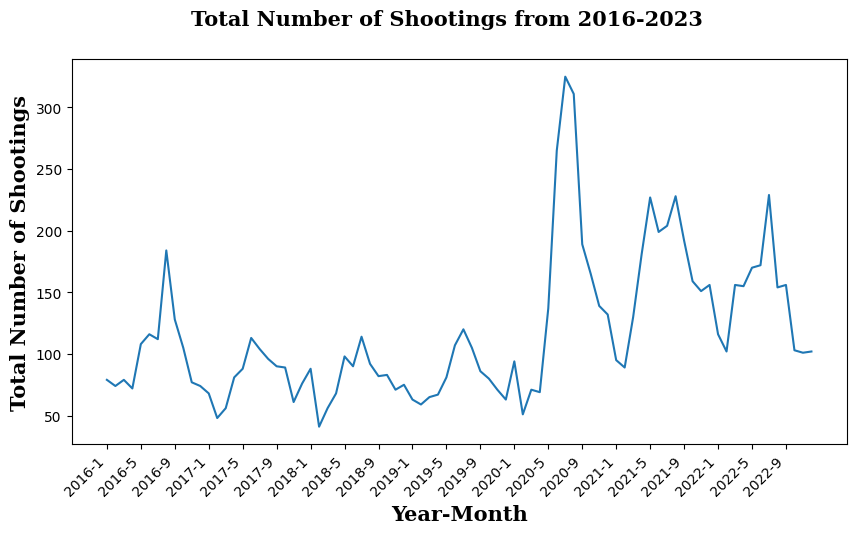

In [8]:
# Now we graph the line graph
fname = f'.{PLOTS_DIR}shootings_per_month_year.png'
x_label = "Year-Month"
y_label = "Total Number of Shootings"
y = shootings_year_month.select(y_label).rdd.flatMap(lambda x: x).collect()
x_ticks = shootings_year_month.select(x_label).rdd.flatMap(lambda x: x).collect()
x = [i for i in range(len(x_ticks))]
make_matplotlib_line(fname, "Total Number of Shootings from 2016-2023", x, y, x_label, y_label, x_ticks, dataset=None)
make_plotly_line("Total Number of Shootings from 2016-2023", x, y, x_label, y_label, x_ticks=None, dataset=None)

- Due to this trend, we will filter our dataset to only include 2022-2023

In [9]:
original_count = raw_shootings.count()
original_count

9778

In [10]:
within_year = raw_shootings.filter((F.col(YEAR) >= 2022) & (F.col(YEAR) <= 2023)).count()
original_count - raw_shootings.count()

0

- Can see that we are losing 8,062 entries out of 9778 entries.
- This then leaves us with 1,716 entries

In [11]:
new_count = raw_shootings.count()
new_count

9778

- Put on the filter in our dataset

In [12]:
raw_shootings = raw_shootings.filter((F.col(YEAR) >= 2022) & (F.col(YEAR) <= DOWNLOAD_BOUND))

## NULL, MISSING, AND WRONG VALUE REMOVAL
- There is no real wrong business rule in the current dataset as most of the values are categorical in nature, so our only real concern are missing values, though we will still cehck for some possibly missing values
- We will run through some of the values to see if there are any interesting missing values
    - When trial and erroring, the only real missing value was for perpetrator and victim fields specifically, there were UNKNOWN entries, indicating null
    - There were also "(null)" entries put, so we have to account for those as well

In [13]:
UNKNOWN = "UNKNOWN"
raw_shootings.filter(F.col("vic_race") == UNKNOWN)

23/08/22 04:57:21 WARN package: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


incident_key,occur_date,occur_time,boro,loc_of_occur_desc,precinct,jurisdiction_code,loc_classfctn_desc,location_desc,statistical_murder_flag,perp_age_group,perp_sex,perp_race,vic_age_group,vic_sex,vic_race,x_coord_cd,y_coord_cd,latitude,longitude,lon_lat,year,month,day,hour,day_of_week
260374587,2022-12-21,08:35:00,BROOKLYN,OUTSIDE,79,0,STREET,(null),false,25-44,M,BLACK,UNKNOWN,M,UNKNOWN,996599,189082,40.685655,-73.955472,POINT (-73.955472...,2022,12,21,8,4


In [14]:
NULL_STRING = "(null)"
raw_shootings.filter(F.col("location_desc") == NULL_STRING)

incident_key,occur_date,occur_time,boro,loc_of_occur_desc,precinct,jurisdiction_code,loc_classfctn_desc,location_desc,statistical_murder_flag,perp_age_group,perp_sex,perp_race,vic_age_group,vic_sex,vic_race,x_coord_cd,y_coord_cd,latitude,longitude,lon_lat,year,month,day,hour,day_of_week
250584475,2022-09-03,22:45:00,BROOKLYN,OUTSIDE,90,0,STREET,(null),false,(null),(null),(null),18-24,F,WHITE HISPANIC,998002,196692,null,null,null,2022,9,3,22,7
259091227,2022-12-19,23:23:00,BROOKLYN,OUTSIDE,60,0,STREET,(null),false,25-44,M,BLACK,25-44,M,BLACK,990784,149362,null,null,null,2022,12,19,23,2
251253188,2022-09-18,03:40:00,MANHATTAN,OUTSIDE,34,0,STREET,(null),false,(null),(null),(null),18-24,M,BLACK HISPANIC,1002173,249401,null,null,null,2022,9,18,3,1
243566884,2022-04-12,22:08:00,BRONX,OUTSIDE,49,0,STREET,(null),true,18-24,M,BLACK HISPANIC,18-24,F,BLACK,1020669,255027,40.86658962,-73.86832754,POINT (-73.868327...,2022,4,12,22,3
256484816,2022-12-17,04:08:00,BRONX,OUTSIDE,52,0,STREET,(null),false,25-44,M,WHITE HISPANIC,25-44,M,WHITE HISPANIC,1008387,253290,40.86186421,-73.91273918,POINT (-73.912739...,2022,12,17,4,7
250216145,2022-08-27,00:21:00,BRONX,OUTSIDE,44,0,VEHICLE,(null),false,(null),(null),(null),25-44,M,WHITE HISPANIC,1008878,244480,40.837683,-73.910994,POINT (-73.910994...,2022,8,27,0,7
247542571,2022-07-04,22:20:00,BRONX,OUTSIDE,48,0,STREET,(null),false,(null),(null),(null),45-64,M,BLACK,1016802,250581,40.854402,-73.88233,POINT (-73.88233 ...,2022,7,4,22,2
251813843,2022-09-29,21:32:00,BROOKLYN,OUTSIDE,81,0,STREET,(null),false,25-44,M,BLACK,25-44,M,WHITE HISPANIC,1004140,191775,40.693035,-73.928275,POINT (-73.928275...,2022,9,29,21,5
252647537,2022-10-16,20:05:00,BROOKLYN,OUTSIDE,75,0,STREET,(null),true,25-44,M,BLACK,25-44,F,BLACK,1014192,182173,40.666649,-73.892068,POINT (-73.892068...,2022,10,16,20,1
249207672,2022-08-08,04:20:00,MANHATTAN,OUTSIDE,20,0,STREET,(null),false,18-24,M,BLACK,25-44,M,BLACK HISPANIC,989132,222591,40.777638,-73.982369,POINT (-73.982369...,2022,8,8,4,2


- Now we remove these values

In [15]:
NULL_STRING = "(null)"
UNKNOWN = "UNKNOWN"

# Calculate missing value percentages for different data types
missing_shootings = raw_shootings.select(*[
    F.when(F.col(c).isNull() | (F.col(c) == NULL_STRING) | (F.col(c) == UNKNOWN), 1).otherwise(0).alias(c)
    for c, t in raw_shootings.dtypes if t == "string"
] + [
    F.when(F.isnan(F.col(c)) | F.col(c).isNull(), 1).otherwise(0).alias(c)
    for c, t in raw_shootings.dtypes if t not in ("string", "timestamp", "date", "timestamp_ntz")
] + [
    F.when(F.col(c).isNull(), 1).otherwise(0).alias(c)
    for c, t in raw_shootings.dtypes if t in ("timestamp", "date", "timestamp_ntz")
])

# Calculate missing value percentages as a percentage of total rows
total_rows = raw_shootings.count()
missing_shootings_percent = missing_shootings.select([
    (F.sum(F.col(c)) / total_rows * 100).alias(c)
    for c in missing_shootings.columns
])

missing_shootings_percent.show()

+------------+----------+----+-----------------+--------+-----------------+------------------+-----------------+-----------------------+----------------+----------------+----------------+-------------------+-------+-------------------+----------+----------+------------------+------------------+------------------+----+-----+---+----+-----------+----------+
|incident_key|occur_time|boro|loc_of_occur_desc|precinct|jurisdiction_code|loc_classfctn_desc|    location_desc|statistical_murder_flag|  perp_age_group|        perp_sex|       perp_race|      vic_age_group|vic_sex|           vic_race|x_coord_cd|y_coord_cd|          latitude|         longitude|           lon_lat|year|month|day|hour|day_of_week|occur_date|
+------------+----------+----+-----------------+--------+-----------------+------------------+-----------------+-----------------------+----------------+----------------+----------------+-------------------+-------+-------------------+----------+----------+------------------+--------

- Now we plot the missing values 

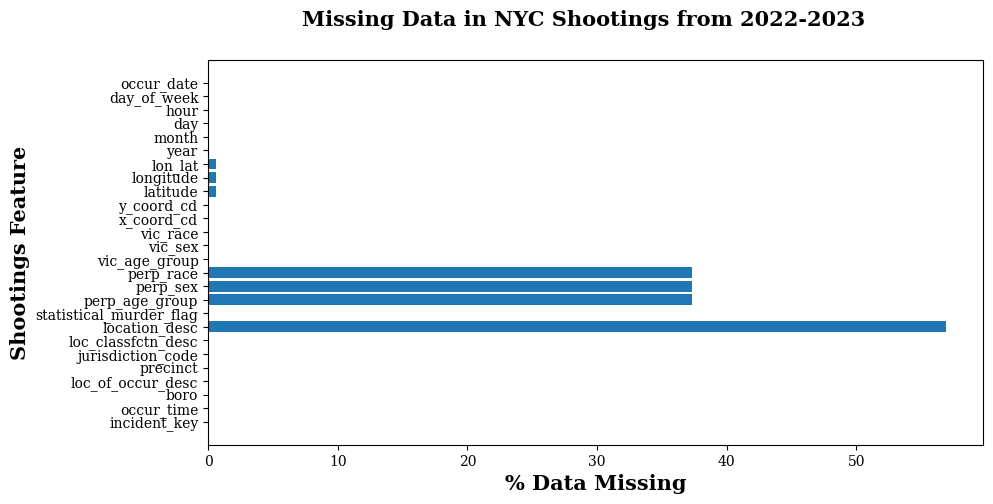

In [16]:
# Need these to make a bar chart
x_ticks = []
y_axis = []

# This row extraction method is not recommended,
# but we only have one index anyway so this can work
target_row_number = 0 
target_row = missing_shootings_percent.filter(F.monotonically_increasing_id() == target_row_number)
for col in missing_shootings_percent.columns:
    val = target_row.select(col).first()[0]
    x_ticks.append(col)
    y_axis.append(val)

# print(y_axis)

x_label = "Shootings Feature"
y_label = "% Data Missing"
x_axis = [i for i in range(len(x_ticks))]
fname = f'.{PLOTS_DIR}shootings_missing_data.png'

# Now plot
title = "Missing Data in NYC Shootings from 2022-2023"
make_matplotlib_barh(fname, title, x_ticks, y_axis, y_label, x_label)
make_plotly_barh(title, x_ticks, y_axis, y_label, x_label)

- We can see that the most missing data are perpetrator data and location data, because of the size of missing data we will jsut drop these columns

In [17]:
raw_shootings = raw_shootings.drop(LOC_DESC, LOC_CLASSIFICATION_DESC, LOC_OF_OCCUR_DESC, PERP_AGE_GROUP, PERP_RACE, PERP_SEX)
missing_shootings = missing_shootings.drop(LOC_DESC, LOC_CLASSIFICATION_DESC, LOC_OF_OCCUR_DESC, PERP_AGE_GROUP, PERP_RACE, PERP_SEX)

- Now we actually drop the values that are null, since if we did this before dropping everything would disappear

In [18]:
# Now we will just loop to filter the dataframe
original_count = raw_shootings.count()

for c, t in raw_shootings.dtypes:
    if t == "string":
        raw_shootings = raw_shootings.filter((F.col(c).isNotNull()) & (F.col(c) != NULL_STRING) & (F.col(c) != UNKNOWN))
    elif t not in ("string", "timestamp", "date", "timestamp_ntz"):
        raw_shootings = raw_shootings.filter(~(F.isnan(F.col(c))) & (F.col(c).isNotNull()))
    elif t in ("timestamp", "date", "timestamp_ntz"):
        raw_shootings = raw_shootings.filter(F.col(c).isNotNull())
raw_shootings.count(), original_count

(1705, 1716)

- Also make sure the entries are unique, 1,536 of these entries were not distinct

In [19]:
curr_count = raw_shootings.count()
curr_count

1705

In [20]:
distinct = raw_shootings.distinct().count()
raw_shootings = raw_shootings.distinct()
distinct

1536

- Last step before one hot encoding is to get the location ID based on the longitude and latitude

- First get the relevant files shape files

In [21]:
taxi_sf = gpd.read_file(f'.{TAXI_SHAPE_FILE}')
taxi_sf = taxi_sf.to_crs(epsg=4326)

# We have to extract longitude and latitude centroids
# Calculate centroids of polygons and create a DataFrame with centroids' coordinates
centroids = taxi_sf.centroid
centroids_df = pd.DataFrame({'Latitude': centroids.y, 'Longitude': centroids.x})

# Merge centroids DataFrame with the original sf GeoDataFrame based on index
taxi_sf = pd.merge(taxi_sf, centroids_df, left_index=True, right_index=True)

zones = pd.read_csv(f'.{ZONE_DIR}ny_zones_lookup.csv')

gdf = gpd.GeoDataFrame(
    pd.merge(zones, taxi_sf, on='LocationID', how='inner')
)

/tmp/ipykernel_52817/2904349055.py:6: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




- We can map each shootings entry to a taxi location id by getting the centroid (in longitude and latitude) of every taxi zone from the shape file, then we just map each shootings entry to its nearest taxi location id

In [22]:
# Define the coordinate transformation using pyproj
nad83_to_wgs84 = pyproj.Transformer.from_crs(pyproj.CRS("epsg:2263"), pyproj.CRS("epsg:4326"), always_xy=True).transform


# Define a UDF to perform the transformation and return a STRUCT
def transform_coordinates(x, y):
    lon, lat = nad83_to_wgs84(x, y)
    return (lon, lat)

schema = StructType([
    StructField("longitude", DoubleType(), False),
    StructField("latitude", DoubleType(), False)
])

transform_udf = F.udf(transform_coordinates, schema)

# Add new columns for longitude and latitude using the UDF
shootings_with_coords = raw_shootings.withColumn("coordinates", transform_udf("x_coord_cd", "y_coord_cd"))

# Extract longitude and latitude from the STRUCT
shootings_with_coords = shootings_with_coords.withColumn("longitude", shootings_with_coords["coordinates"].longitude) \
                                             .withColumn("latitude", shootings_with_coords["coordinates"].latitude).drop("lon_lat")
# Show the resulting DataFrame
shootings_with_coords.show()

+------------+----------+----------+---------+--------+-----------------+-----------------------+-------------+-------+--------------+----------+----------+------------------+------------------+----+-----+---+----+-----------+--------------------+
|incident_key|occur_date|occur_time|     boro|precinct|jurisdiction_code|statistical_murder_flag|vic_age_group|vic_sex|      vic_race|x_coord_cd|y_coord_cd|          latitude|         longitude|year|month|day|hour|day_of_week|         coordinates|
+------------+----------+----------+---------+--------+-----------------+-----------------------+-------------+-------+--------------+----------+----------+------------------+------------------+----+-----+---+----+-----------+--------------------+
|   248855179|2022-08-01|  00:25:00| BROOKLYN|      70|                0|                  false|        25-44|      M|         BLACK|    994849|    175294| 40.64781180711209|-73.96180511316089|2022|    8|  1|   0|          2|{-73.961805113160...|
|   2458

- In this case we can just save the dataframe as a Pandas dataframe since the file size is pretty small anyway

In [23]:
import math
import numpy as np

GPD_LONGITUDE = "Longitude"
GPD_LATITUDE = "Latitude"
SHOOTING_ID = "incident_key"
LOCATION_ID = "LocationID"
ROW_LONGITUDE = "longitude"
ROW_LATITUDE = "latitude"
TAXI_LOCATION_ID = "taxi_location_id"
INCIDENT_KEY = "incident_key"
CENTROID_LONGITUDE = "Longitude"
CENTROID_LATITUDE = "Latitude"

# We will use Euclidean distance in this case
def calculate_distance(lon, lat):
    """
    Calculates euclidean distance of a pandas df row entry
    with each possible location's centroid in a Geos Dataframe
    - Parameters
        - Lon: Longitude input
        - Lat: Latitude input
    - Returns
        - Double representing distance
    """
    distances = np.sqrt((lon - gdf[CENTROID_LONGITUDE])**2 + (lat - gdf[CENTROID_LATITUDE])**2)
    min_distance_index = np.argmin(distances)
    return gdf[LOCATION_ID][min_distance_index]

# Find nearest location by looping
incident_keys = shootings_with_coords.select(INCIDENT_KEY).agg(F.collect_list(INCIDENT_KEY)).collect()[0][0]
location_ids = []
for index, row in shootings_with_coords.toPandas().iterrows():
    location_ids.append(calculate_distance(row[ROW_LONGITUDE], row[ROW_LATITUDE]))

pandas_shootings = shootings_with_coords.toPandas()
locations_series = pd.Series(location_ids)

pandas_shootings[TAXI_LOCATION_ID] = locations_series

- Now we can one hot encode
    - good thing abou tone hot encoding is that any of these cases, it is unlikely we will find a new column value will appear
    - Now we can just one hot encode the columns

In [24]:
# Now let's drop our unnecessary columns
pandas_shootings = pandas_shootings.drop([OCCUR_TIME, BORO, PRECINCT,
                                          X_COORD_CD, Y_COORD_CD, LATITUDE, 
                                          LONGITUDE, YEAR, MONTH, DAY, "coordinates", 
                                          INCIDENT_KEY], axis=1)
pandas_shootings

,occur_date,jurisdiction_code,statistical_murder_flag,vic_age_group,vic_sex,vic_race,hour,day_of_week,taxi_location_id
0,2022-08-01,0,false,25-44,M,BLACK,0,2,89
1,2022-05-31,0,true,25-44,M,BLACK,1,3,17
2,2022-05-22,0,false,<18,F,BLACK,0,1,159
3,2022-12-04,2,false,25-44,M,BLACK,20,1,74
4,2022-07-21,0,false,25-44,M,BLACK,20,5,62
...,...,...,...,...,...,...,...,...,...
1531,2022-03-11,0,false,25-44,M,WHITE HISPANIC,18,6,14
1532,2022-06-23,0,false,25-44,M,WHITE HISPANIC,10,5,20
1533,2022-11-30,0,true,<18,M,BLACK,21,4,94
1534,2022-05-18,0,false,25-44,M,WHITE,19,4,245


- Now that we have the locations and we filtered out the null values, leaving only relevant datapoints, we can now look at the geospatial data of shootings around NYC

In [25]:
shootings_counts = pandas_shootings.groupby(TAXI_LOCATION_ID).agg({
    TAXI_LOCATION_ID : 'count'
}).rename(columns = {f'{TAXI_LOCATION_ID}': "total_shootings"})
pandas_shootings
geoJSON = gdf[['LocationID', 'geometry']].drop_duplicates('LocationID').to_json()

In [26]:
import folium
# Now we create the maps for the pick_ups and drop_offs respectviely
m = folium.Map(location=[40.73, -73.74], tiles="Stamen Terrain", zoom_start=10)

# refer to the folium documentations on more information on how to plot aggregated data.
c = folium.Choropleth(
    geo_data=geoJSON, # geoJSON 
    name='choropleth', # name of plot
    data=shootings_counts.reset_index(), # data source
    columns=[TAXI_LOCATION_ID,'total_shootings'], # the columns required
    key_on='properties.LocationID', # this is from the geoJSON's properties
    fill_color='YlOrRd', # color scheme
    nan_fill_color='black',
    legend_name='Number of Shootings'
)

c.add_to(m)
m
# m.save(f'.{TAXI_MAP_FILE_FRMT}pu_total_riders{PNG}')

- We want to use locations where a lot of shootings happen, so a convenient bound would be >=30
- This leaves us with 9 relevant shooting locations

In [27]:
agg_shootings = shootings_counts.sort_values("total_shootings", ascending=False)
# We will now select the top 10 locations with shootings, since shootings
# should only be relevant in these specific areas
most_shootings = list(agg_shootings.iloc[:10, :][TAXI_LOCATION_ID])
most_shootings

,total_shootings
taxi_location_id,
35,56
74,42
42,37
177,36
168,36
61,35
225,33
78,32
159,32


In [28]:
import folium
# Now we create the maps for the pick_ups and drop_offs respectviely
m = folium.Map(location=[40.73, -73.74], tiles="Stamen Terrain", zoom_start=10)

# refer to the folium documentations on more information on how to plot aggregated data.
c = folium.Choropleth(
    geo_data=geoJSON, # geoJSON 
    name='choropleth', # name of plot
    data=most_shootings.reset_index(), # data source
    columns=[TAXI_LOCATION_ID,'total_shootings'], # the columns required
    key_on='properties.LocationID', # this is from the geoJSON's properties
    fill_color='YlOrRd', # color scheme
    nan_fill_color='black',
    legend_name='Number of Shootings'
)

c.add_to(m)
m
# m.save(f'.{TAXI_MAP_FILE_FRMT}pu_total_riders{PNG}')

- Now let's see how much of our dataset is gone because of this
- We can see that we go from 1536 entries to just 370

In [29]:
most_shootings_count = len(pandas_shootings[pandas_shootings[TAXI_LOCATION_ID].isin(most_shootings.index)])
original_filtered_count = len(pandas_shootings)
original_filtered_count, most_shootings_count, original_filtered_count-most_shootings_count

(1536, 370, 1166)

- Now apply the filter

In [30]:
pandas_shootings = pandas_shootings[pandas_shootings[TAXI_LOCATION_ID].isin(most_shootings.index)]

In [30]:
pandas_shootings

,occur_date


- Now we one hot encode using PANDAS DUMMIES

In [31]:
CATEGORICAL_VARS = [JURISDICTION_CODE,
                    STATISTICAL_MURDER_FLAG, VIC_AGE_GROUP,
                    VIC_SEX, VIC_RACE, HOUR, DAY_OF_WEEK,
                    TAXI_LOCATION_ID]

for col in CATEGORICAL_VARS:
    curr_dummies = pd.get_dummies(pandas_shootings[col])
    # Make sure for each value in the dummies, we rename properly
    rename_dict = {}
    for name in curr_dummies.columns:
        rename_dict[name] = f'{col}_{name}'
    pandas_shootings = pd.concat([pandas_shootings, curr_dummies], axis=1)
    pandas_shootings = pandas_shootings.rename(columns=rename_dict)

pandas_shootings = pandas_shootings.drop(CATEGORICAL_VARS, axis=1)
pandas_shootings

,occur_date,jurisdiction_code_0,jurisdiction_code_1,jurisdiction_code_2,statistical_murder_flag_false,statistical_murder_flag_true,vic_age_group_18-24,vic_age_group_25-44,vic_age_group_45-64,vic_age_group_65+,...,taxi_location_id_35,taxi_location_id_42,taxi_location_id_61,taxi_location_id_74,taxi_location_id_78,taxi_location_id_159,taxi_location_id_168,taxi_location_id_169,taxi_location_id_177,taxi_location_id_225
2,2022-05-22,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,2022-12-04,0,0,1,1,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
5,2022-06-23,1,0,0,1,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
7,2022-02-20,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
8,2022-12-06,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1511,2022-12-15,1,0,0,1,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1521,2022-06-01,1,0,0,1,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
1522,2022-09-25,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
1523,2022-09-06,0,0,1,1,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0


- Now aggregate the data together
- This will all be done in the to_curated.py file

In [32]:
# First we want to exclude columns like day of week since we're not trying to add these together
cols_exclude = [f'day_of_week_{i}' for i in range(FROM_DAY_OF_WEEK, TO_DAY_OF_WEEK+1)] + [SHOOTINGS_DATE.lower()]
# Now we make the aggregation dict
agg_dict = {col: 'sum' if col not in cols_exclude else 'first' for col in pandas_shootings.columns if col != SHOOTINGS_DATE.lower()}

aggregated_shootings = pandas_shootings.groupby(SHOOTINGS_DATE.lower()).agg(agg_dict).reset_index()


In [ ]:
aggregated_shootings

,occur_date,jurisdiction_code_0,jurisdiction_code_1,jurisdiction_code_2,statistical_murder_flag_false,statistical_murder_flag_true,vic_age_group_18-24,vic_age_group_25-44,vic_age_group_45-64,vic_age_group_65+,...,taxi_location_id_35,taxi_location_id_42,taxi_location_id_61,taxi_location_id_74,taxi_location_id_78,taxi_location_id_159,taxi_location_id_168,taxi_location_id_169,taxi_location_id_177,taxi_location_id_225
0,2022-01-01,1,0,1,2,0,0,2,0,0,...,0,0,0,2,0,0,0,0,0,0
1,2022-01-05,1,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,2022-01-06,1,0,1,1,1,0,1,0,0,...,0,0,0,0,2,0,0,0,0,0
3,2022-01-07,1,0,1,2,0,0,1,1,0,...,0,0,0,0,0,0,1,1,0,0
4,2022-01-08,2,0,0,2,0,1,1,0,0,...,2,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194,2022-12-23,1,0,0,1,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0
195,2022-12-24,1,0,0,1,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
196,2022-12-25,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
197,2022-12-26,1,0,0,0,1,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
